LOAD THE DATASET

In [21]:
# Install missing packages (if needed)
!pip install lime shap matplotlib seaborn pandas scikit-learn openpyxl

# Importing libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score, classification_report, cohen_kappa_score
)
import lime.lime_tabular
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import time

# For visualizing SHAP
shap.initjs()

# Load the dataset
df = pd.read_excel('Accident_Dataset_Preprocessing.xlsx', sheet_name='Accident')

# Display the first few rows
df.head()


,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,...,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,01:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,01:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury


1. DATA PREPROCESSING

In [22]:
# 1. Drop columns with more than 50% missing values
threshold = 0.5 * len(df)
df = df.dropna(thresh=threshold, axis=1)

# 2. Drop rows where critical values are missing (target or key columns)
df = df.dropna(subset=['Accident_severity', 'Time'])

# 3. Impute categorical features with the most frequent value (mode)
for column in df.select_dtypes(include='object').columns:
    df[column].fillna(df[column].mode()[0], inplace=True)

# 4. Impute numerical features with the median value
for column in df.select_dtypes(include=['int64', 'float64']).columns:
    df[column].fillna(df[column].median(), inplace=True)

# Verify if all missing values are handled
print(df.isnull().sum())

# Save the preprocessed dataset to an Excel file
df.to_excel('Accident_Dataset_After_Preprocessing.xlsx', index=False)
print("Preprocessed dataset saved successfully.")


Time                           0
Day_of_week                    0
Age_band_of_driver             0
Sex_of_driver                  0
Educational_level              0
Vehicle_driver_relation        0
Driving_experience             0
Type_of_vehicle                0
Owner_of_vehicle               0
Service_year_of_vehicle        0
Defect_of_vehicle              0
Area_accident_occured          0
Lanes_or_Medians               0
Road_allignment                0
Types_of_Junction              0
Road_surface_type              0
Road_surface_conditions        0
Light_conditions               0
Weather_conditions             0
Type_of_collision              0
Number_of_vehicles_involved    0
Number_of_casualties           0
Vehicle_movement               0
Casualty_class                 0
Sex_of_casualty                0
Age_band_of_casualty           0
Casualty_severity              0
Work_of_casuality              0
Fitness_of_casuality           0
Pedestrian_movement            0
Cause_of_a

For the above steps:

Step 1: Drop columns where more than 50% of values are missing to avoid introducing noise.

Step 2: Drop rows where target values (Accident_severity) or critical features are missing since they are essential for prediction.

Step 3: For categorical variables, use mode (most frequent value) to fill missing data.

Step 4: For numerical variables, use the median to avoid the effect of outliers.


NOW SAVE THE PREPROCESSED DATASET TO A NEW EXCEL

In [23]:
# Save the preprocessed dataset to an Excel file
df.to_excel('Accident_Dataset_After_Preprocessing.xlsx', index=False)

print("Preprocessed dataset saved as 'Accident_Dataset_After_Preprocessing.xlsx'")


Preprocessed dataset saved as 'Accident_Dataset_After_Preprocessing.xlsx'


LOAD PREPROCESSED DATASET

In [24]:
# Load the preprocessed dataset
df = pd.read_excel('Accident_Dataset_After_Preprocessing.xlsx')

# Display the first few rows to confirm
df.head()


,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,na,na,na,na,Driver,Normal,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,na,na,na,na,Driver,Normal,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,Unknown,...,Going straight,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Changing lane to the left,Serious Injury
3,01:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,Unknown,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,01:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,Automobile,Owner,5-10yrs,...,Going straight,na,na,na,na,Driver,Normal,Not a Pedestrian,Overtaking,Slight Injury


MODEL BUILDING AND EVALUATION

In [25]:
# Encode categorical variables
label_encoders = {}
for column in df.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

# Separate features and target
X = df.drop('Accident_severity', axis=1)
y = df['Accident_severity']

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train the Decision Tree model
start_time = time.time()
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
dt_time = time.time() - start_time

# Train the Logistic Regression model
start_time = time.time()
lr_model = LogisticRegression(max_iter=1000, random_state=42)
lr_model.fit(X_train, y_train)
lr_time = time.time() - start_time

# Define a function to evaluate models
def evaluate_model(model, X_test, y_test, model_name, train_time):
    y_pred = model.predict(X_test)
    print(f"Performance Metrics for {model_name}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred, average='weighted'))
    print("Recall:", recall_score(y_test, y_pred, average='weighted'))
    print("F1 Score:", f1_score(y_test, y_pred, average='weighted'))
    print("Cohen's Kappa:", cohen_kappa_score(y_test, y_pred))
    print("Training Time:", train_time, "seconds")
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Evaluate both models
evaluate_model(dt_model, X_test, y_test, "Decision Tree", dt_time)
evaluate_model(lr_model, X_test, y_test, "Logistic Regression", lr_time)


Performance Metrics for Decision Tree:
Accuracy: 0.7593344155844156
Precision: 0.7715719456537042
Recall: 0.7593344155844156
F1 Score: 0.7651859738258828
Cohen's Kappa: 0.17187783379883215
Training Time: 0.11581206321716309 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.29      0.32      0.31        37
           1       0.26      0.30      0.28       363
           2       0.87      0.85      0.86      2064

    accuracy                           0.76      2464
   macro avg       0.48      0.49      0.48      2464
weighted avg       0.77      0.76      0.77      2464

Performance Metrics for Logistic Regression:
Accuracy: 0.8376623376623377
Precision: 0.7016781919379322
Recall: 0.8376623376623377
F1 Score: 0.7636638979395164
Cohen's Kappa: 0.0
Training Time: 0.10464596748352051 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
      

c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classifi

VISUALIZATIONS

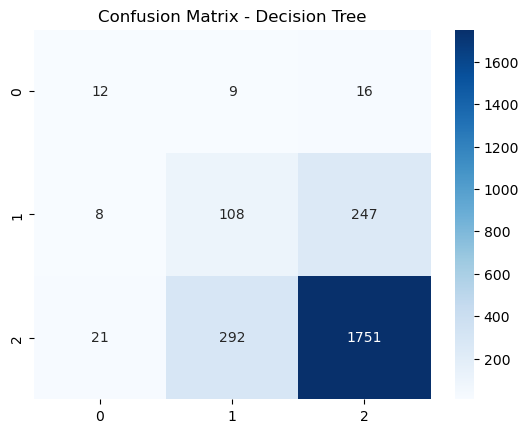

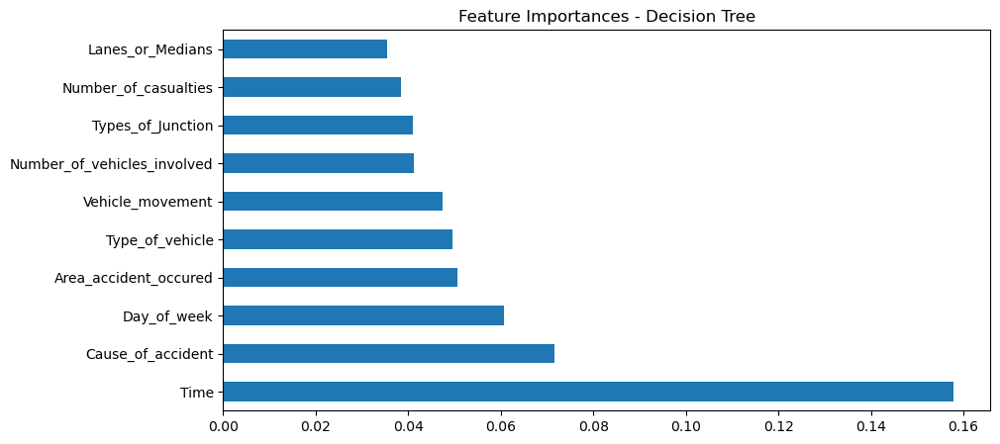

In [26]:
# Confusion Matrix for Decision Tree
dt_conf_matrix = confusion_matrix(y_test, dt_model.predict(X_test))
sns.heatmap(dt_conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix - Decision Tree')
plt.show()

# Feature Importance for Decision Tree
plt.figure(figsize=(10, 5))
feature_importances = pd.Series(dt_model.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importances - Decision Tree')
plt.show()


XAI TECHNIQUES - LIME AND SHAP

LIME

In [27]:
# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train, feature_names=X.columns, class_names=['Slight', 'Serious'], mode='classification'
)

# Explain a sample prediction with LIME (Decision Tree)
i = 5  # Example index from test set
exp = explainer.explain_instance(X_test[i], dt_model.predict_proba)
exp.show_in_notebook()


SHAP

c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:624: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


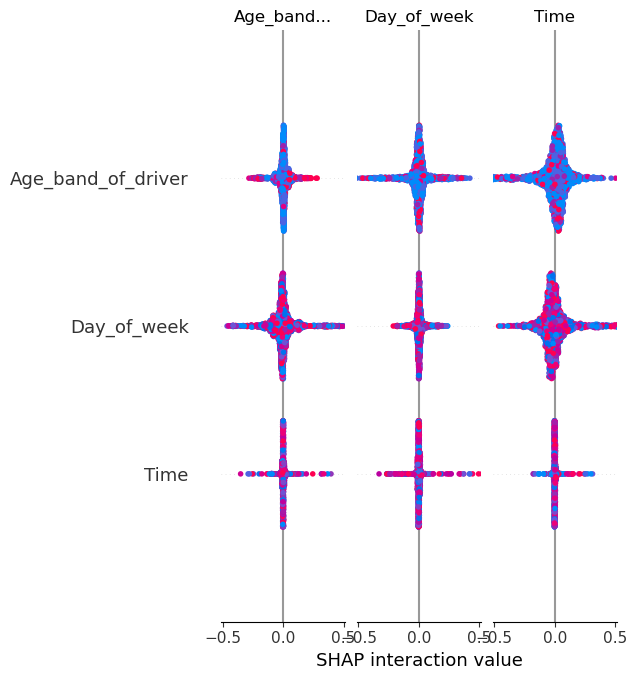

In [28]:
# Initialize SHAP TreeExplainer
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)

# Plot SHAP summary
shap.summary_plot(shap_values, X_test, feature_names=X.columns)


       Time Day_of_week Age_band_of_driver Sex_of_driver   Educational_level  \
0  17:02:00      Monday              18-30          Male   Above high school   
1  17:02:00      Monday              31-50          Male  Junior high school   
2  17:02:00      Monday              18-30          Male  Junior high school   
3  01:06:00      Sunday              18-30          Male  Junior high school   
4  01:06:00      Sunday              18-30          Male  Junior high school   

  Vehicle_driver_relation Driving_experience      Type_of_vehicle  \
0                Employee              1-2yr           Automobile   
1                Employee         Above 10yr  Public (> 45 seats)   
2                Employee              1-2yr      Lorry (41?100Q)   
3                Employee             5-10yr  Public (> 45 seats)   
4                Employee              2-5yr           Automobile   

  Owner_of_vehicle Service_year_of_vehicle  ... Vehicle_movement  \
0            Owner              Abov

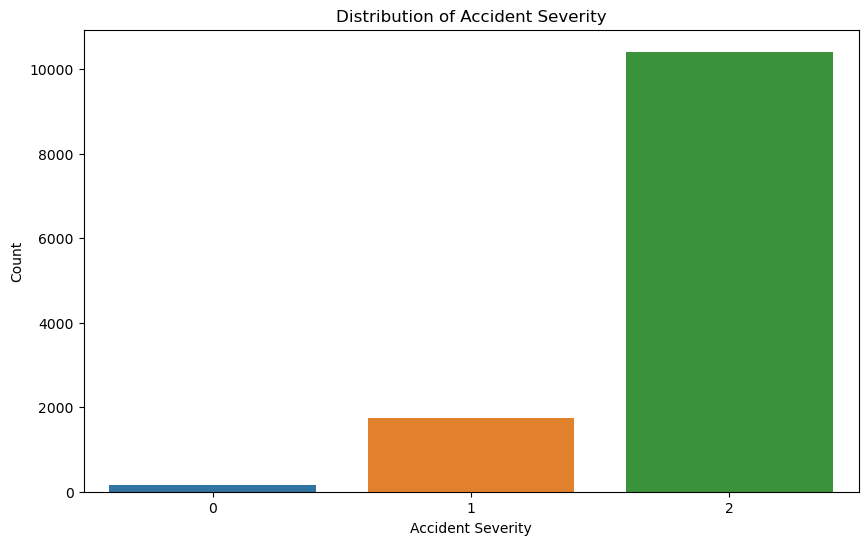

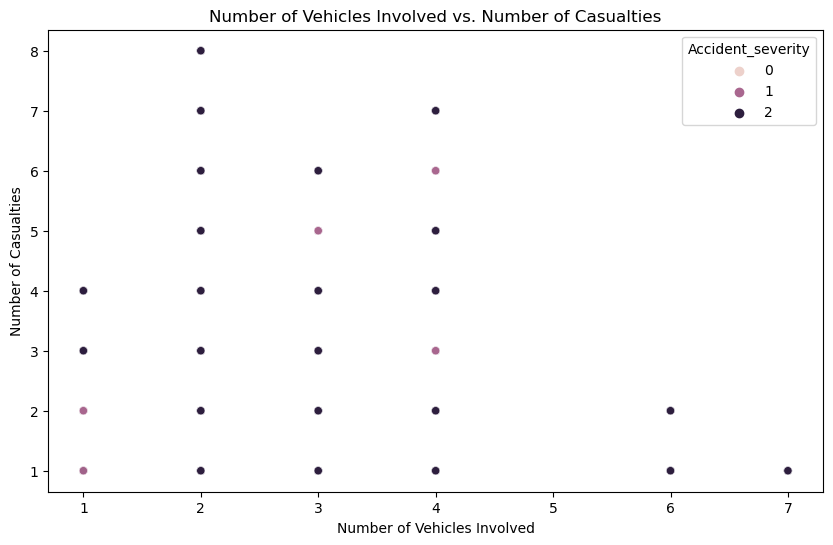

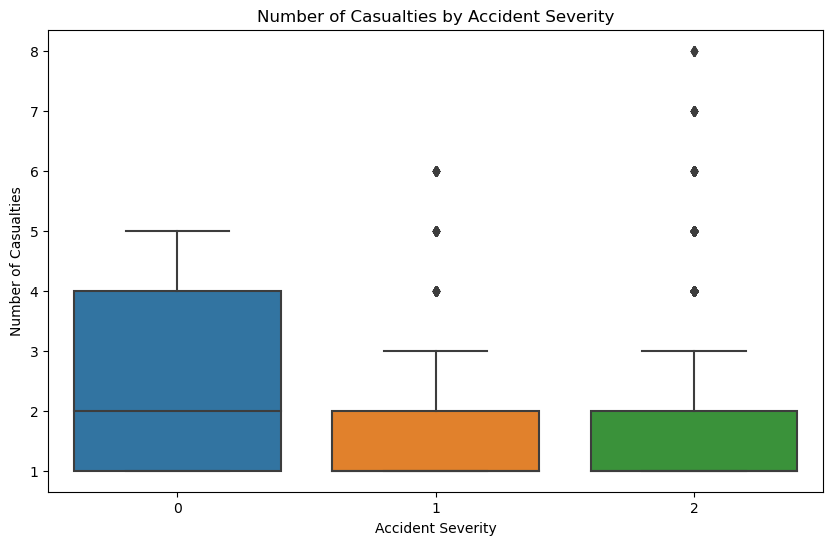

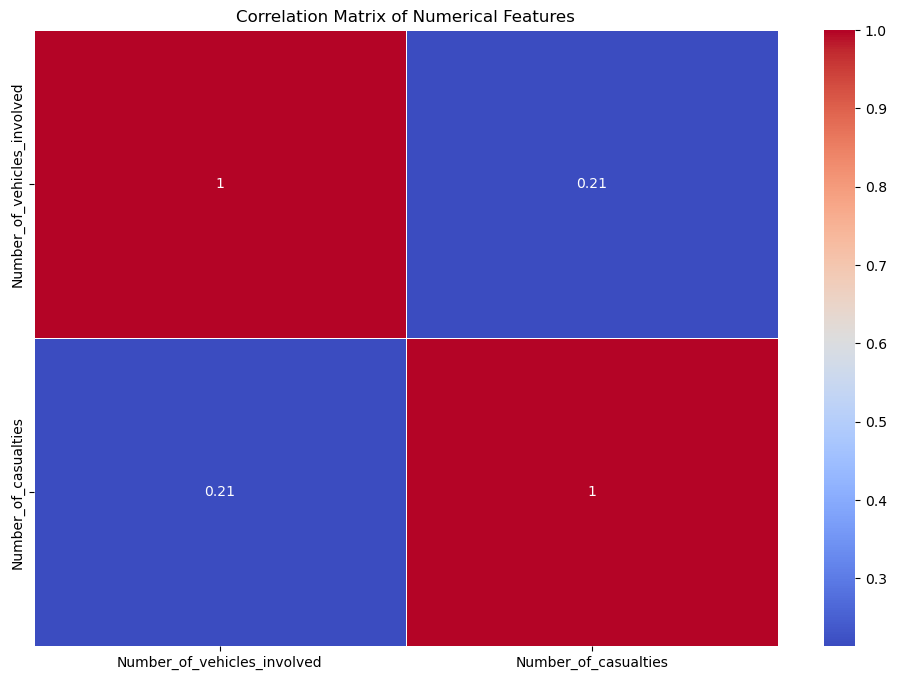

Performance Metrics for Decision Tree:
Accuracy: 0.7593344155844156
Precision: 0.7715719456537042
Recall: 0.7593344155844156
F1 Score: 0.7651859738258828
Cohen's Kappa: 0.17187783379883215
Training Time: 0.10928893089294434 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.29      0.32      0.31        37
           1       0.26      0.30      0.28       363
           2       0.87      0.85      0.86      2064

    accuracy                           0.76      2464
   macro avg       0.48      0.49      0.48      2464
weighted avg       0.77      0.76      0.77      2464

Performance Metrics for Logistic Regression:
Accuracy: 0.8376623376623377
Precision: 0.7016781919379322
Recall: 0.8376623376623377
F1 Score: 0.7636638979395164
Cohen's Kappa: 0.0
Training Time: 0.09335875511169434 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
      

c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classifi

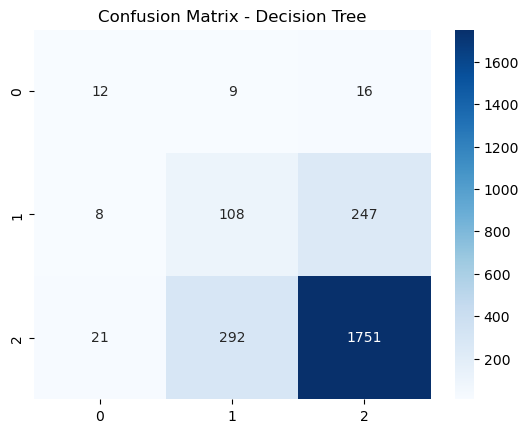

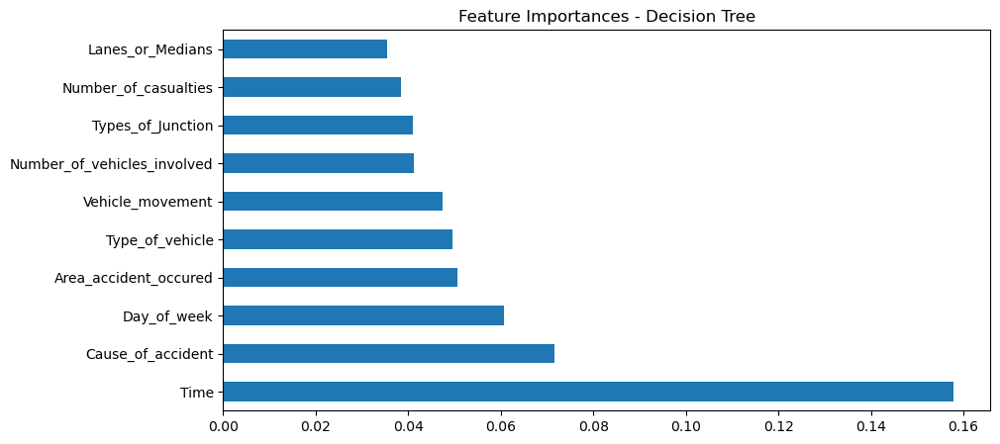

c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:624: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


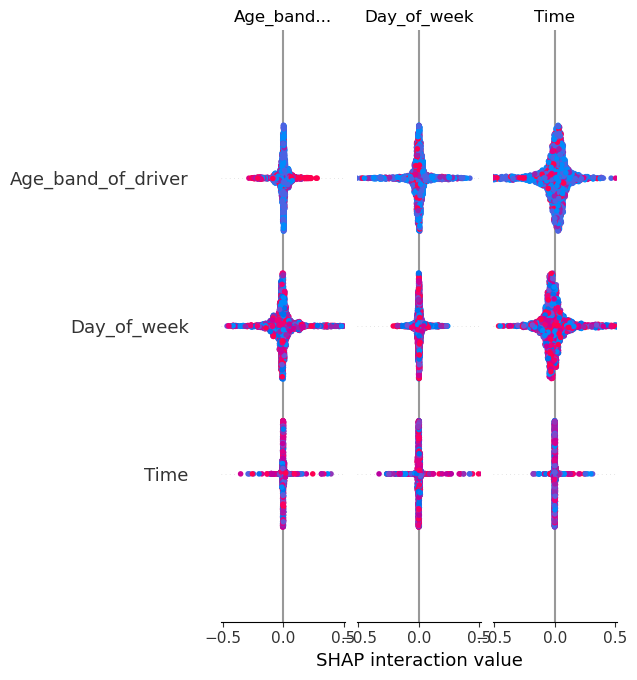

In [1]:
# Install missing packages (if needed)
!pip install lime shap matplotlib seaborn pandas scikit-learn openpyxl

# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, cohen_kappa_score
)
import lime.lime_tabular
import shap
import time

# For visualizing SHAP
shap.initjs()

# Load the dataset
df = pd.read_excel('Accident_Dataset_After_Preprocessing.xlsx')

# Display the first few rows to confirm data
print(df.head())

# Encode categorical variables
label_encoders = {}
for column in df.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

# Separate features and target
X = df.drop('Accident_severity', axis=1)
y = df['Accident_severity']

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Basic Statistics: Mean, Median, Mode
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
statistics_summary = pd.DataFrame({
    'Mean': df[numerical_columns].mean(),
    'Median': df[numerical_columns].median(),
    'Mode': df[numerical_columns].mode().iloc[0]
})

print(statistics_summary)

# Visualizations

# 1. Histogram of Accident Severity
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Accident_severity')
plt.title('Distribution of Accident Severity')
plt.xlabel('Accident Severity')
plt.ylabel('Count')
plt.show()

# 2. Scatter Plot: Number of Vehicles vs. Number of Casualties
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Number_of_vehicles_involved', y='Number_of_casualties', hue='Accident_severity', alpha=0.7)
plt.title('Number of Vehicles Involved vs. Number of Casualties')
plt.xlabel('Number of Vehicles Involved')
plt.ylabel('Number of Casualties')
plt.show()

# 3. Boxplot: Number of Casualties by Accident Severity
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Accident_severity', y='Number_of_casualties')
plt.title('Number of Casualties by Accident Severity')
plt.xlabel('Accident Severity')
plt.ylabel('Number of Casualties')
plt.show()

# 4. Heatmap of Correlation Matrix for Numerical Features
plt.figure(figsize=(12, 8))
correlation_matrix = df[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Training and Evaluating Models

# Train Decision Tree Model
dt_model = DecisionTreeClassifier(random_state=42)
start_time = time.time()
dt_model.fit(X_train, y_train)
dt_time = time.time() - start_time

# Train Logistic Regression Model
lr_model = LogisticRegression(max_iter=1000, random_state=42)
start_time = time.time()
lr_model.fit(X_train, y_train)
lr_time = time.time() - start_time

# Function to Evaluate Models
def evaluate_model(model, X_test, y_test, model_name, train_time):
    y_pred = model.predict(X_test)
    print(f"Performance Metrics for {model_name}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred, average='weighted'))
    print("Recall:", recall_score(y_test, y_pred, average='weighted'))
    print("F1 Score:", f1_score(y_test, y_pred, average='weighted'))
    print("Cohen's Kappa:", cohen_kappa_score(y_test, y_pred))
    print("Training Time:", train_time, "seconds")
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Evaluate Models
evaluate_model(dt_model, X_test, y_test, "Decision Tree", dt_time)
evaluate_model(lr_model, X_test, y_test, "Logistic Regression", lr_time)

# Decision Tree Confusion Matrix
dt_conf_matrix = confusion_matrix(y_test, dt_model.predict(X_test))
sns.heatmap(dt_conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix - Decision Tree')
plt.show()

# Feature Importance for Decision Tree
plt.figure(figsize=(10, 5))
feature_importances = pd.Series(dt_model.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importances - Decision Tree')
plt.show()

# Initialize LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train, feature_names=X.columns, class_names=['Slight', 'Serious'], mode='classification'
)

# Explain a Sample Prediction with LIME
i = 5  # Example index from test set
exp = explainer.explain_instance(X_test[i], dt_model.predict_proba)
exp.show_in_notebook()

# Initialize SHAP Explainer
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)

# Plot SHAP Summary
shap.summary_plot(shap_values, X_test, feature_names=X.columns)


       Time Day_of_week Age_band_of_driver Sex_of_driver   Educational_level  \
0  17:02:00      Monday              18-30          Male   Above high school   
1  17:02:00      Monday              31-50          Male  Junior high school   
2  17:02:00      Monday              18-30          Male  Junior high school   
3  01:06:00      Sunday              18-30          Male  Junior high school   
4  01:06:00      Sunday              18-30          Male  Junior high school   

  Vehicle_driver_relation Driving_experience      Type_of_vehicle  \
0                Employee              1-2yr           Automobile   
1                Employee         Above 10yr  Public (> 45 seats)   
2                Employee              1-2yr      Lorry (41?100Q)   
3                Employee             5-10yr  Public (> 45 seats)   
4                Employee              2-5yr           Automobile   

  Owner_of_vehicle Service_year_of_vehicle  ... Vehicle_movement  \
0            Owner              Abov

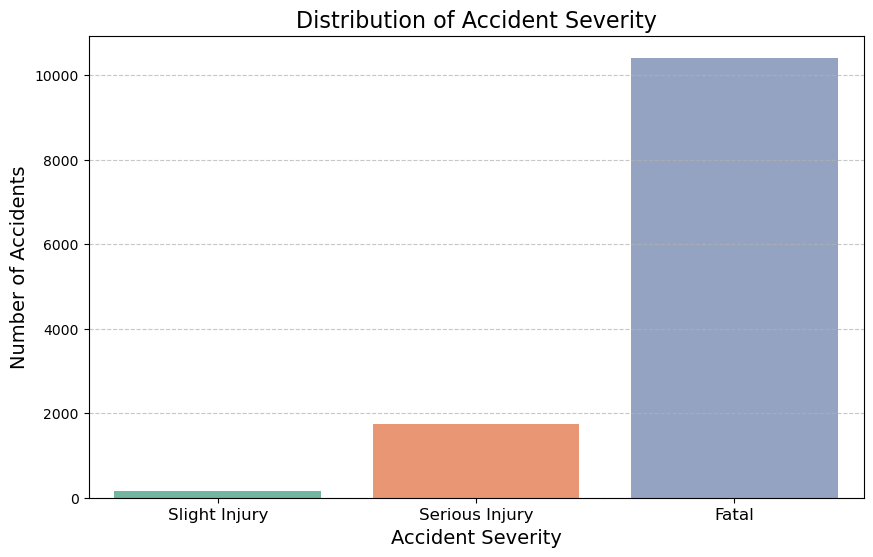

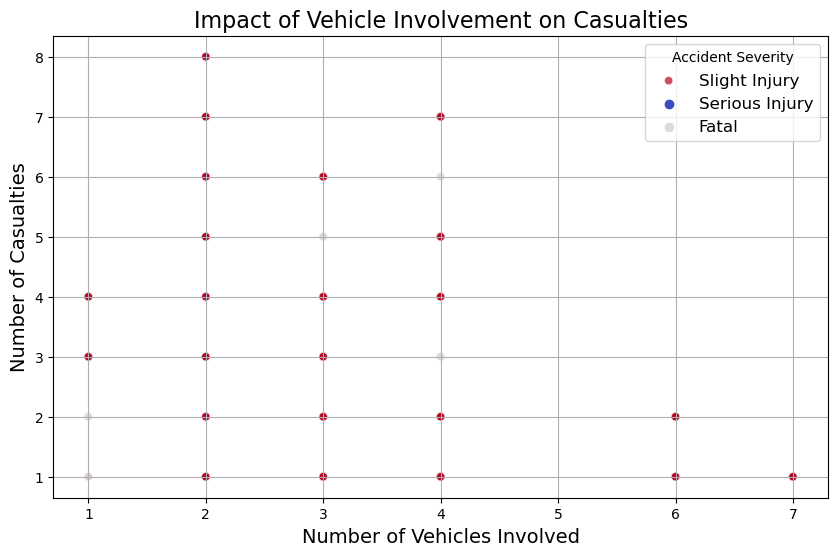

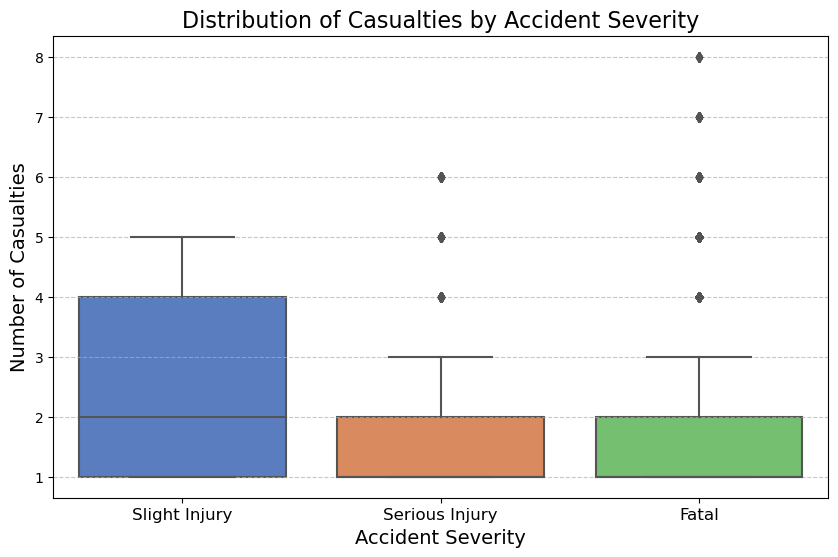

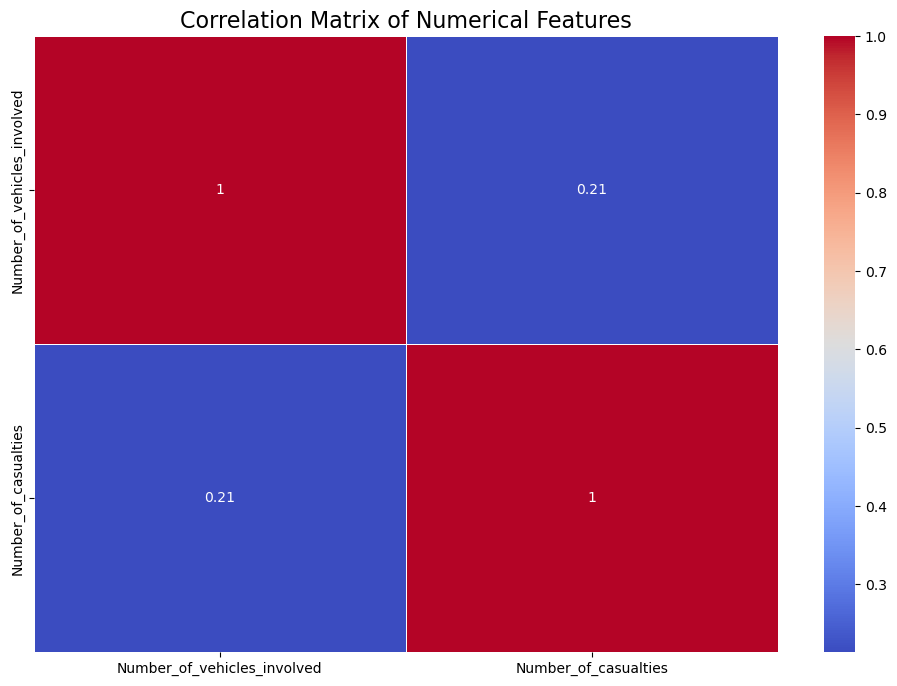

Performance Metrics for Decision Tree:
Accuracy: 0.7593344155844156
Precision: 0.7715719456537042
Recall: 0.7593344155844156
F1 Score: 0.7651859738258828
Cohen's Kappa: 0.17187783379883215
Training Time: 0.13604378700256348 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.29      0.32      0.31        37
           1       0.26      0.30      0.28       363
           2       0.87      0.85      0.86      2064

    accuracy                           0.76      2464
   macro avg       0.48      0.49      0.48      2464
weighted avg       0.77      0.76      0.77      2464

Performance Metrics for Logistic Regression:
Accuracy: 0.8376623376623377
Precision: 0.7016781919379322
Recall: 0.8376623376623377
F1 Score: 0.7636638979395164
Cohen's Kappa: 0.0
Training Time: 0.13319706916809082 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
      

c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classifi

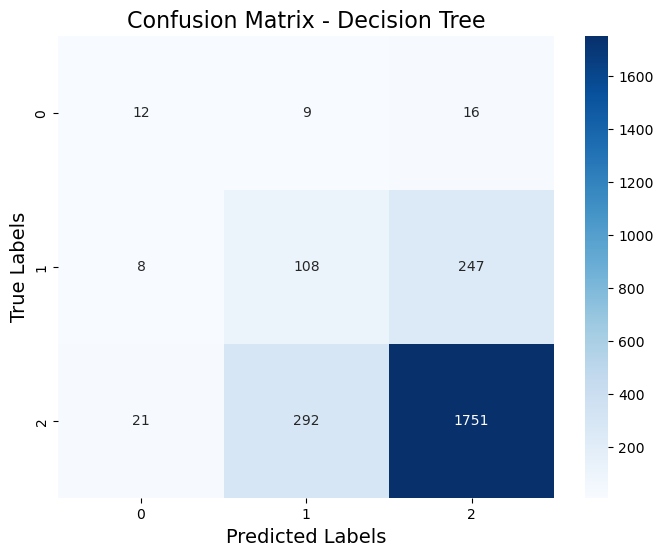

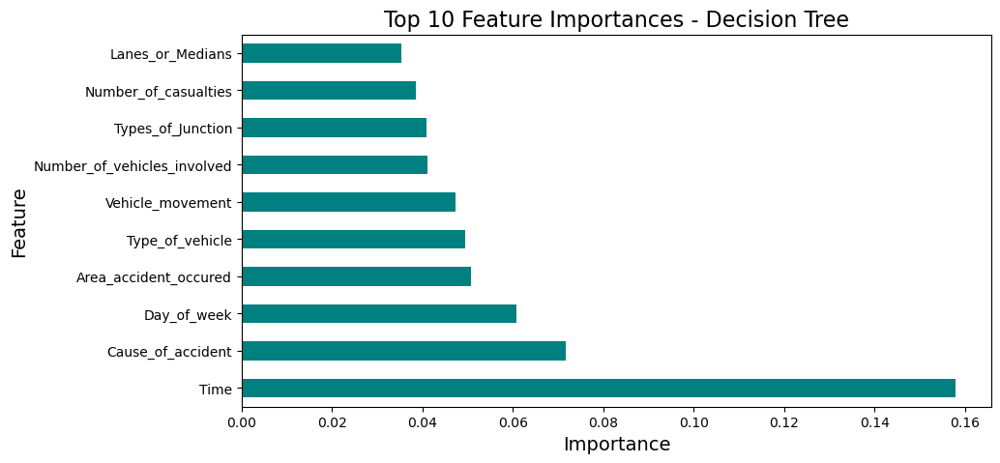

In [2]:
# Install missing packages (if needed)
!pip install lime shap matplotlib seaborn pandas scikit-learn openpyxl

# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, cohen_kappa_score
)
import lime.lime_tabular
import shap
import time

# For visualizing SHAP
shap.initjs()

# Load the dataset
df = pd.read_excel('Accident_Dataset_After_Preprocessing.xlsx')

# Display the first few rows to confirm data
print(df.head())

# Encode categorical variables
label_encoders = {}
for column in df.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

# Separate features and target
X = df.drop('Accident_severity', axis=1)
y = df['Accident_severity']

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Basic Statistics: Mean, Median, Mode
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
statistics_summary = pd.DataFrame({
    'Mean': df[numerical_columns].mean(),
    'Median': df[numerical_columns].median(),
    'Mode': df[numerical_columns].mode().iloc[0]
})

print(statistics_summary)

# Visualizations

# 1. Histogram of Accident Severity
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Accident_severity', palette='Set2')
plt.title('Distribution of Accident Severity', fontsize=16)
plt.xlabel('Accident Severity', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(ticks=[0, 1, 2], labels=['Slight Injury', 'Serious Injury', 'Fatal'], fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# 2. Scatter Plot: Number of Vehicles vs. Number of Casualties
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Number_of_vehicles_involved', y='Number_of_casualties', 
                hue='Accident_severity', palette='coolwarm', alpha=0.7)
plt.title('Impact of Vehicle Involvement on Casualties', fontsize=16)
plt.xlabel('Number of Vehicles Involved', fontsize=14)
plt.ylabel('Number of Casualties', fontsize=14)
plt.legend(title='Accident Severity', labels=['Slight Injury', 'Serious Injury', 'Fatal'], fontsize=12)
plt.grid(True)
plt.show()

# 3. Boxplot: Number of Casualties by Accident Severity
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Accident_severity', y='Number_of_casualties', palette='muted')
plt.title('Distribution of Casualties by Accident Severity', fontsize=16)
plt.xlabel('Accident Severity', fontsize=14)
plt.ylabel('Number of Casualties', fontsize=14)
plt.xticks(ticks=[0, 1, 2], labels=['Slight Injury', 'Serious Injury', 'Fatal'], fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# 4. Heatmap of Correlation Matrix for Numerical Features
plt.figure(figsize=(12, 8))
correlation_matrix = df[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features', fontsize=16)
plt.show()

# Training and Evaluating Models

# Train Decision Tree Model
dt_model = DecisionTreeClassifier(random_state=42)
start_time = time.time()
dt_model.fit(X_train, y_train)
dt_time = time.time() - start_time

# Train Logistic Regression Model
lr_model = LogisticRegression(max_iter=1000, random_state=42)
start_time = time.time()
lr_model.fit(X_train, y_train)
lr_time = time.time() - start_time

# Function to Evaluate Models
def evaluate_model(model, X_test, y_test, model_name, train_time):
    y_pred = model.predict(X_test)
    print(f"Performance Metrics for {model_name}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred, average='weighted'))
    print("Recall:", recall_score(y_test, y_pred, average='weighted'))
    print("F1 Score:", f1_score(y_test, y_pred, average='weighted'))
    print("Cohen's Kappa:", cohen_kappa_score(y_test, y_pred))
    print("Training Time:", train_time, "seconds")
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Evaluate Models
evaluate_model(dt_model, X_test, y_test, "Decision Tree", dt_time)
evaluate_model(lr_model, X_test, y_test, "Logistic Regression", lr_time)

# Decision Tree Confusion Matrix
plt.figure(figsize=(8, 6))
dt_conf_matrix = confusion_matrix(y_test, dt_model.predict(X_test))
sns.heatmap(dt_conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix - Decision Tree', fontsize=16)
plt.xlabel('Predicted Labels', fontsize=14)
plt.ylabel('True Labels', fontsize=14)
plt.show()

# Feature Importance for Decision Tree
plt.figure(figsize=(10, 5))
feature_importances = pd.Series(dt_model.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh', color='teal')
plt.title('Top 10 Feature Importances - Decision Tree', fontsize=16)
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.show()


Time                           0
Day_of_week                    0
Age_band_of_driver             0
Sex_of_driver                  0
Educational_level              0
Vehicle_driver_relation        0
Driving_experience             0
Type_of_vehicle                0
Owner_of_vehicle               0
Service_year_of_vehicle        0
Defect_of_vehicle              0
Area_accident_occured          0
Lanes_or_Medians               0
Road_allignment                0
Types_of_Junction              0
Road_surface_type              0
Road_surface_conditions        0
Light_conditions               0
Weather_conditions             0
Type_of_collision              0
Number_of_vehicles_involved    0
Number_of_casualties           0
Vehicle_movement               0
Casualty_class                 0
Sex_of_casualty                0
Age_band_of_casualty           0
Casualty_severity              0
Work_of_casuality              0
Fitness_of_casuality           0
Pedestrian_movement            0
Cause_of_a

c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classifi

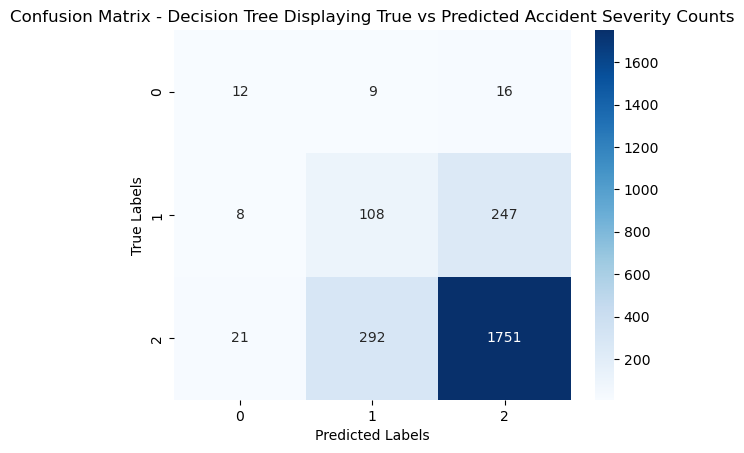

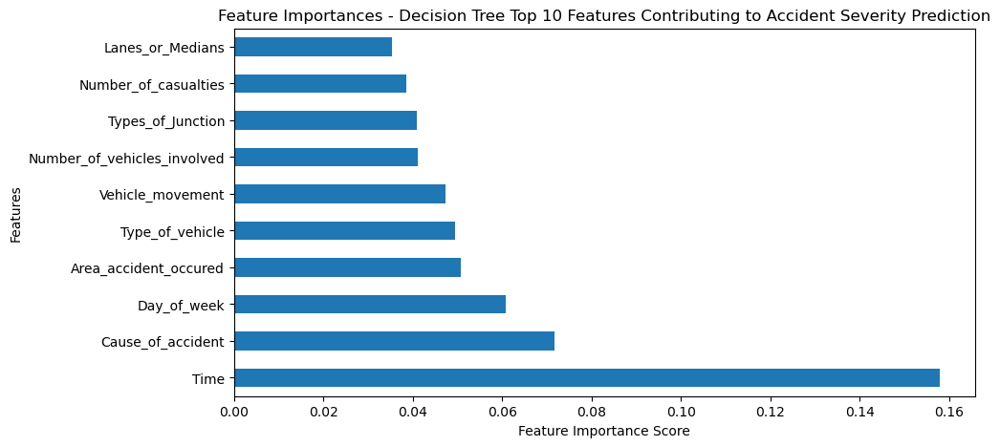

c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:624: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


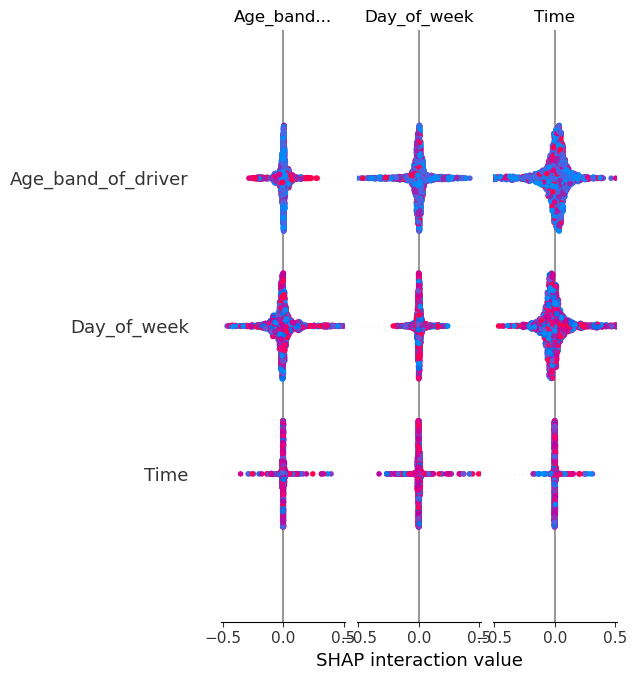

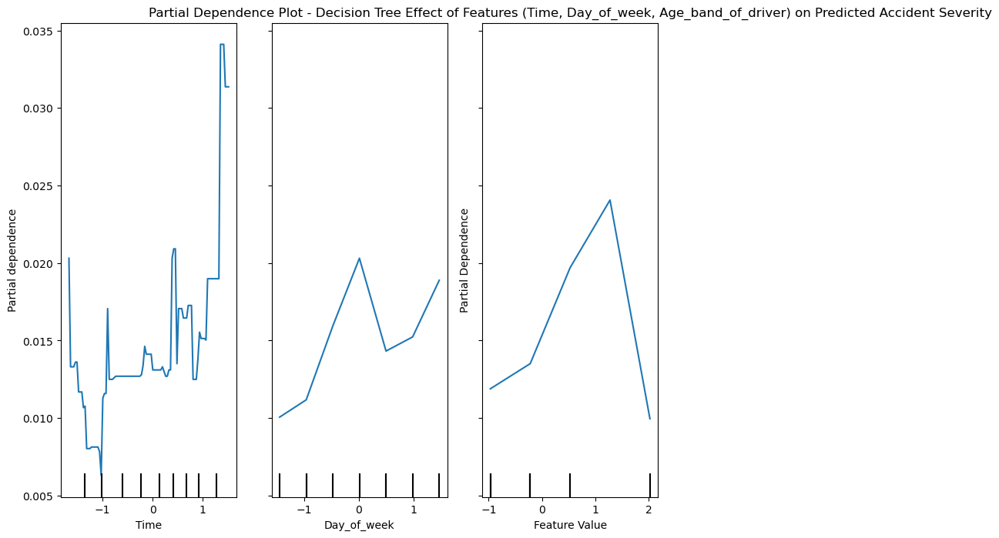

c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:624: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


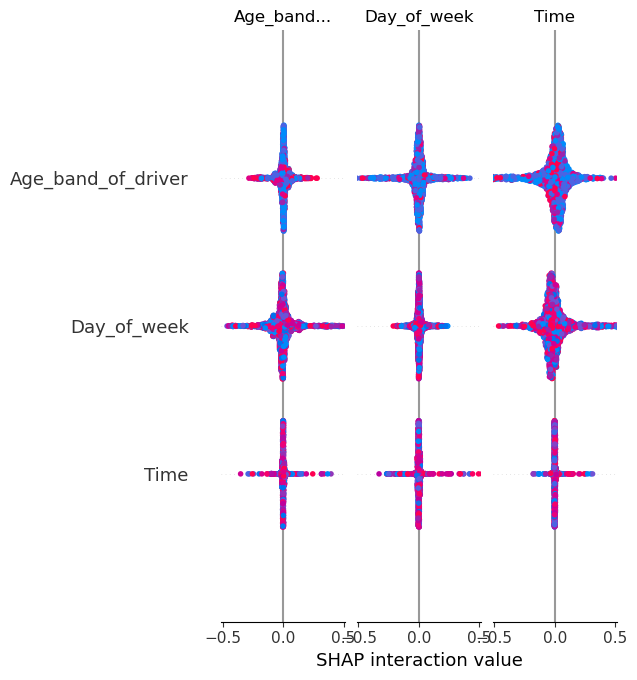

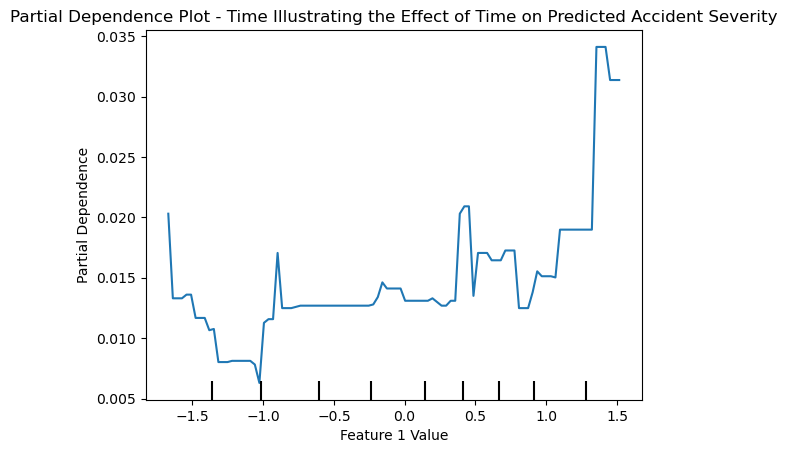

In [20]:
# Install missing packages (if needed)
!pip install lime shap matplotlib seaborn pandas scikit-learn openpyxl

# Importing libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score, classification_report, cohen_kappa_score
)
from sklearn.inspection import partial_dependence, PartialDependenceDisplay
import lime.lime_tabular
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import time

# For visualizing SHAP
shap.initjs()

# Load the dataset
df = pd.read_excel('Accident_Dataset_Preprocessing.xlsx', sheet_name='Accident')

# Display the first few rows
df.head()

# 1. Drop columns with more than 50% missing values
threshold = 0.5 * len(df)
df = df.dropna(thresh=threshold, axis=1)

# 2. Drop rows where critical values are missing (target or key columns)
df = df.dropna(subset=['Accident_severity', 'Time'])

# 3. Impute categorical features with the most frequent value (mode)
for column in df.select_dtypes(include='object').columns:
    df[column].fillna(df[column].mode()[0], inplace=True)

# 4. Impute numerical features with the median value
for column in df.select_dtypes(include=['int64', 'float64']).columns:
    df[column].fillna(df[column].median(), inplace=True)

# Verify if all missing values are handled
print(df.isnull().sum())

# Save the preprocessed dataset to an Excel file
df.to_excel('Accident_Dataset_After_Preprocessing.xlsx', index=False)
print("Preprocessed dataset saved successfully.")

# Load the preprocessed dataset
df = pd.read_excel('Accident_Dataset_After_Preprocessing.xlsx')

# Display the first few rows to confirm
df.head()

# Encode categorical variables
label_encoders = {}
for column in df.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

# Separate features and target
X = df.drop('Accident_severity', axis=1)
y = df['Accident_severity']

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train the Decision Tree model
start_time = time.time()
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
dt_time = time.time() - start_time

# Train the Logistic Regression model
start_time = time.time()
lr_model = LogisticRegression(max_iter=1000, random_state=42)
lr_model.fit(X_train, y_train)
lr_time = time.time() - start_time

# Define a function to evaluate models
def evaluate_model(model, X_test, y_test, model_name, train_time):
    y_pred = model.predict(X_test)
    print(f"Performance Metrics for {model_name}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred, average='weighted'))
    print("Recall:", recall_score(y_test, y_pred, average='weighted'))
    print("F1 Score:", f1_score(y_test, y_pred, average='weighted'))
    print("Cohen's Kappa:", cohen_kappa_score(y_test, y_pred))
    print("Training Time:", train_time, "seconds")
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Evaluate both models
evaluate_model(dt_model, X_test, y_test, "Decision Tree", dt_time)
evaluate_model(lr_model, X_test, y_test, "Logistic Regression", lr_time)

# Confusion Matrix for Decision Tree
dt_conf_matrix = confusion_matrix(y_test, dt_model.predict(X_test))
sns.heatmap(dt_conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix - Decision Tree Displaying True vs Predicted Accident Severity Counts')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Feature Importance for Decision Tree
plt.figure(figsize=(10, 5))
feature_importances = pd.Series(dt_model.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importances - Decision Tree Top 10 Features Contributing to Accident Severity Prediction')
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.show()

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train, feature_names=X.columns, class_names=['Slight', 'Serious'], mode='classification'
)

# Explain a sample prediction with LIME (Decision Tree)
i = 5  # Example index from test set
exp = explainer.explain_instance(X_test[i], dt_model.predict_proba)
exp.show_in_notebook()

# Initialize SHAP TreeExplainer
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)

# Plot SHAP summary
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# Plot PDP (Partial Dependence Plot)
features_to_plot = [0, 1, 2]  # Indexes of features to plot (example)
fig, ax = plt.subplots(figsize=(10, 8))
PartialDependenceDisplay.from_estimator(dt_model, X_train, features=features_to_plot, feature_names=X.columns, target=0, ax=ax)
plt.title(f"Partial Dependence Plot - Decision Tree Effect of Features ({', '.join(X.columns[features_to_plot])}) on Predicted Accident Severity")
plt.xlabel('Feature Value')
plt.ylabel('Partial Dependence')
plt.show()

# Visual comparison of LIME, SHAP, and PDP
# SHAP Summary Plot
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# PDP for one feature
PartialDependenceDisplay.from_estimator(dt_model, X_train, features=[0], feature_names=X.columns, target=0)
plt.title(f"Partial Dependence Plot - {X.columns[0]} Illustrating the Effect of {X.columns[0]} on Predicted Accident Severity")
plt.xlabel('Feature 1 Value')
plt.ylabel('Partial Dependence')
plt.show()


Time                           0
Day_of_week                    0
Age_band_of_driver             0
Sex_of_driver                  0
Educational_level              0
Vehicle_driver_relation        0
Driving_experience             0
Type_of_vehicle                0
Owner_of_vehicle               0
Service_year_of_vehicle        0
Defect_of_vehicle              0
Area_accident_occured          0
Lanes_or_Medians               0
Road_allignment                0
Types_of_Junction              0
Road_surface_type              0
Road_surface_conditions        0
Light_conditions               0
Weather_conditions             0
Type_of_collision              0
Number_of_vehicles_involved    0
Number_of_casualties           0
Vehicle_movement               0
Casualty_class                 0
Sex_of_casualty                0
Age_band_of_casualty           0
Casualty_severity              0
Work_of_casuality              0
Fitness_of_casuality           0
Pedestrian_movement            0
Cause_of_a

c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classifi

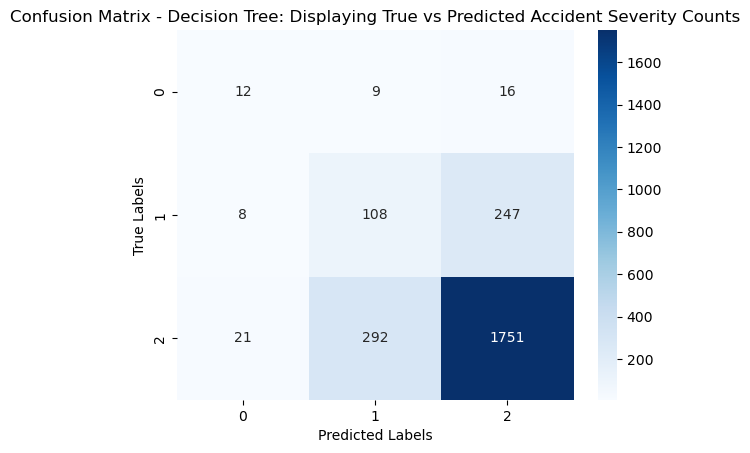

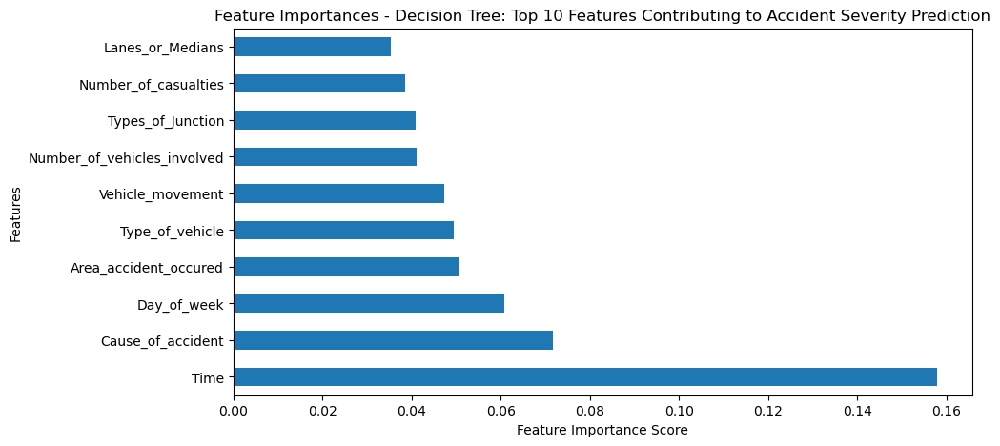

c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:624: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


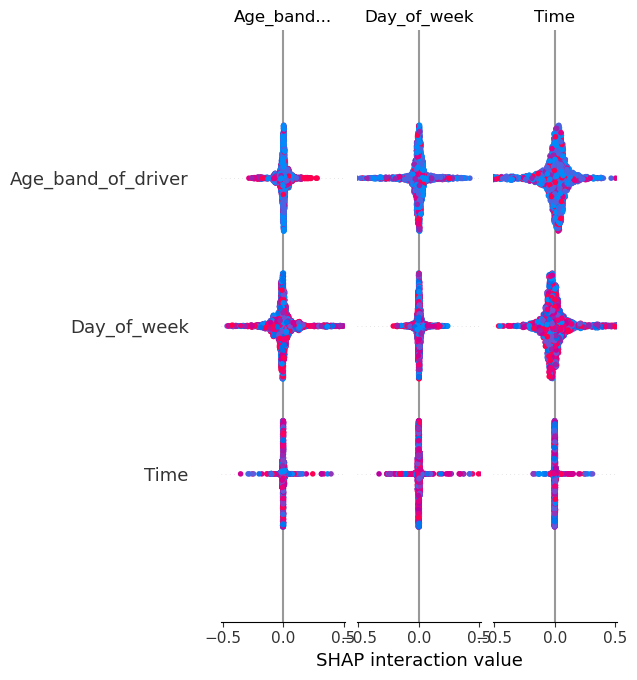

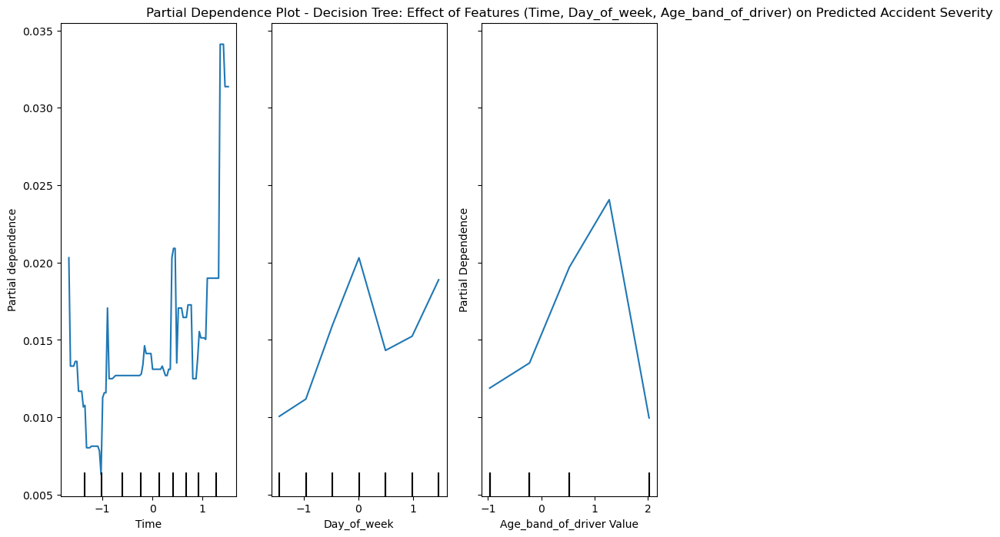

c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:624: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


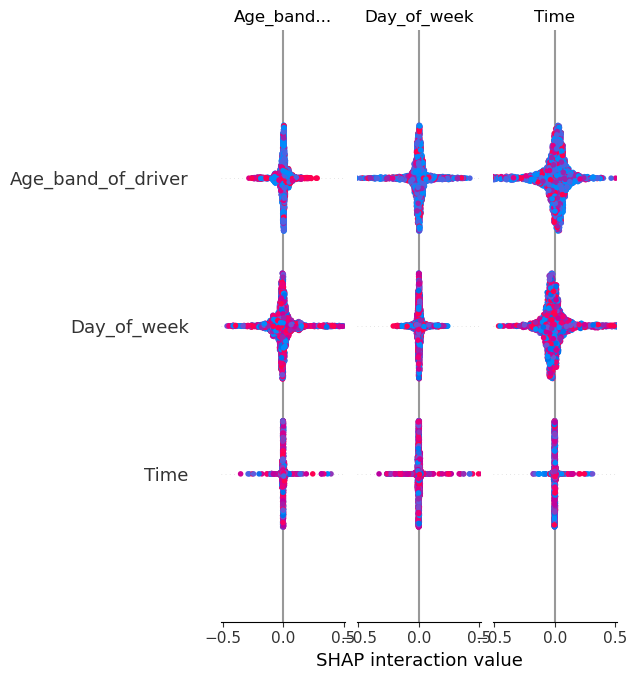

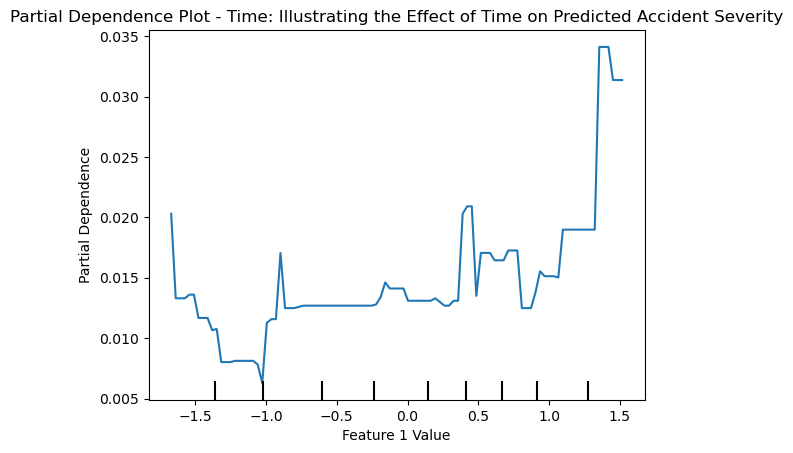

In [24]:
# Install missing packages (if needed)
!pip install lime shap matplotlib seaborn pandas scikit-learn openpyxl

# Importing libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score, classification_report, cohen_kappa_score
)
from sklearn.inspection import partial_dependence, PartialDependenceDisplay
import lime.lime_tabular
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import time

# For visualizing SHAP
shap.initjs()

# Load the dataset
df = pd.read_excel('Accident_Dataset_Preprocessing.xlsx', sheet_name='Accident')

# Display the first few rows
df.head()

# 1. Drop columns with more than 50% missing values
threshold = 0.5 * len(df)
df = df.dropna(thresh=threshold, axis=1)

# 2. Drop rows where critical values are missing (target or key columns)
df = df.dropna(subset=['Accident_severity', 'Time'])

# 3. Impute categorical features with the most frequent value (mode)
for column in df.select_dtypes(include='object').columns:
    df[column].fillna(df[column].mode()[0], inplace=True)

# 4. Impute numerical features with the median value
for column in df.select_dtypes(include=['int64', 'float64']).columns:
    df[column].fillna(df[column].median(), inplace=True)

# Verify if all missing values are handled
print(df.isnull().sum())

# Save the preprocessed dataset to an Excel file
df.to_excel('Accident_Dataset_After_Preprocessing.xlsx', index=False)
print("Preprocessed dataset saved successfully.")

# Load the preprocessed dataset
df = pd.read_excel('Accident_Dataset_After_Preprocessing.xlsx')

# Display the first few rows to confirm
df.head()

# Encode categorical variables
label_encoders = {}
for column in df.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

# Separate features and target
X = df.drop('Accident_severity', axis=1)
y = df['Accident_severity']

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train the Decision Tree model
start_time = time.time()
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
dt_time = time.time() - start_time

# Train the Logistic Regression model
start_time = time.time()
lr_model = LogisticRegression(max_iter=1000, random_state=42)
lr_model.fit(X_train, y_train)
lr_time = time.time() - start_time

# Define a function to evaluate models
def evaluate_model(model, X_test, y_test, model_name, train_time):
    y_pred = model.predict(X_test)
    print(f"Performance Metrics for {model_name}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred, average='weighted'))
    print("Recall:", recall_score(y_test, y_pred, average='weighted'))
    print("F1 Score:", f1_score(y_test, y_pred, average='weighted'))
    print("Cohen's Kappa:", cohen_kappa_score(y_test, y_pred))
    print("Training Time:", train_time, "seconds")
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Evaluate both models
evaluate_model(dt_model, X_test, y_test, "Decision Tree", dt_time)
evaluate_model(lr_model, X_test, y_test, "Logistic Regression", lr_time)

# Confusion Matrix for Decision Tree
dt_conf_matrix = confusion_matrix(y_test, dt_model.predict(X_test))
sns.heatmap(dt_conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix - Decision Tree: Displaying True vs Predicted Accident Severity Counts')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Feature Importance for Decision Tree
plt.figure(figsize=(10, 5))
feature_importances = pd.Series(dt_model.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importances - Decision Tree: Top 10 Features Contributing to Accident Severity Prediction')
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.show()

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train, feature_names=X.columns, class_names=['Slight', 'Serious'], mode='classification'
)

# Explain a sample prediction with LIME (Decision Tree)
i = 5  # Example index from test set
exp = explainer.explain_instance(X_test[i], dt_model.predict_proba)
exp.show_in_notebook()

# Initialize SHAP TreeExplainer
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)

# Plot SHAP summary
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# Plot PDP (Partial Dependence Plot)
features_to_plot = [0, 1, 2]  # Indexes of features to plot (example)
fig, ax = plt.subplots(figsize=(10, 8))
PartialDependenceDisplay.from_estimator(dt_model, X_train, features=features_to_plot, feature_names=X.columns, target=0, ax=ax)
plt.title(f"Partial Dependence Plot - Decision Tree: Effect of Features ({', '.join(X.columns[features_to_plot])}) on Predicted Accident Severity")
plt.xlabel(f"{X.columns[2]} Value")
plt.ylabel('Partial Dependence')
plt.show()

# Visual comparison of LIME, SHAP, and PDP
# SHAP Summary Plot
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# PDP for one feature
PartialDependenceDisplay.from_estimator(dt_model, X_train, features=[0], feature_names=X.columns, target=0)
plt.title(f"Partial Dependence Plot - {X.columns[0]}: Illustrating the Effect of {X.columns[0]} on Predicted Accident Severity")
plt.xlabel('Feature 1 Value')
plt.ylabel('Partial Dependence')
plt.show()


Time                           0
Day_of_week                    0
Age_band_of_driver             0
Sex_of_driver                  0
Educational_level              0
Vehicle_driver_relation        0
Driving_experience             0
Type_of_vehicle                0
Owner_of_vehicle               0
Service_year_of_vehicle        0
Defect_of_vehicle              0
Area_accident_occured          0
Lanes_or_Medians               0
Road_allignment                0
Types_of_Junction              0
Road_surface_type              0
Road_surface_conditions        0
Light_conditions               0
Weather_conditions             0
Type_of_collision              0
Number_of_vehicles_involved    0
Number_of_casualties           0
Vehicle_movement               0
Casualty_class                 0
Sex_of_casualty                0
Age_band_of_casualty           0
Casualty_severity              0
Work_of_casuality              0
Fitness_of_casuality           0
Pedestrian_movement            0
Cause_of_a

c:\Users\fabio\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:19:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Performance Metrics for Decision Tree:
Accuracy: 0.7593344155844156
Precision: 0.7715719456537042
Recall: 0.7593344155844156
F1 Score: 0.7651859738258828
Cohen's Kappa: 0.17187783379883215
Training Time: 0.18327951431274414 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.29      0.32      0.31        37
           1       0.26      0.30      0.28       363
           2       0.87      0.85      0.86      2064

    accuracy                           0.76      2464
   macro avg       0.48      0.49      0.48      2464
weighted avg       0.77      0.76      0.77      2464

Performance Metrics for Logistic Regression:
Accuracy: 0.8376623376623377
Precision: 0.7016781919379322
Recall: 0.8376623376623377
F1 Score: 0.7636638979395164
Cohen's Kappa: 0.0
Training Time: 0.12835431098937988 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
      

c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classifi

Performance Metrics for XGBoost:
Accuracy: 0.8474025974025974
Precision: 0.8199815527666685
Recall: 0.8474025974025974
F1 Score: 0.8003330052269246
Cohen's Kappa: 0.16918819403280871
Training Time: 1.1786189079284668 seconds

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.16      0.28        37
           1       0.61      0.12      0.19       363
           2       0.85      0.99      0.92      2064

    accuracy                           0.85      2464
   macro avg       0.82      0.42      0.46      2464
weighted avg       0.82      0.85      0.80      2464

Performance Metrics for Support Vector Machine:
Accuracy: 0.8376623376623377
Precision: 0.7016781919379322
Recall: 0.8376623376623377
F1 Score: 0.7636638979395164
Cohen's Kappa: 0.0
Training Time: 34.01893877983093 seconds

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1

c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\fabio\anaconda3\Lib\site-packages\sklearn\metrics\_classifi

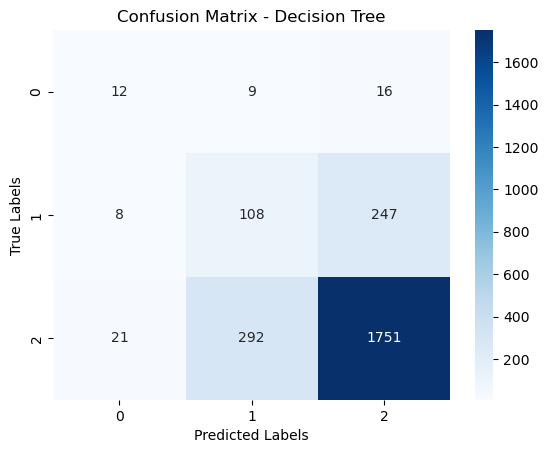

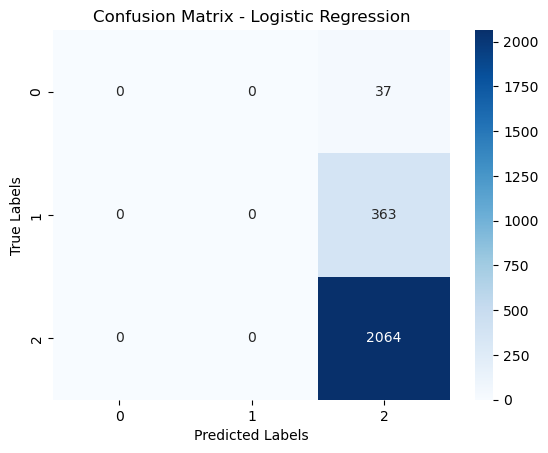

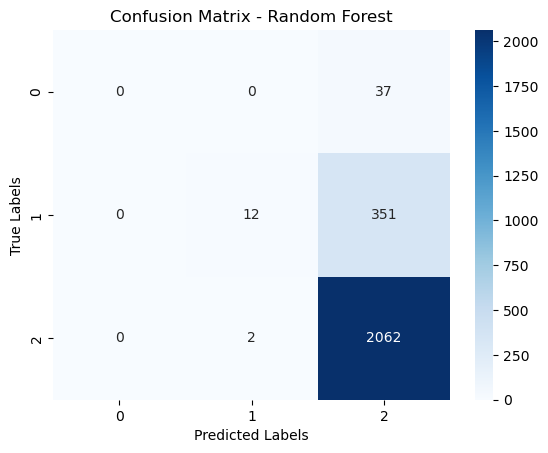

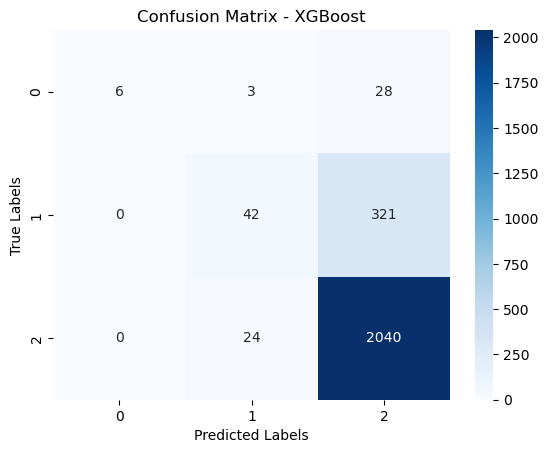

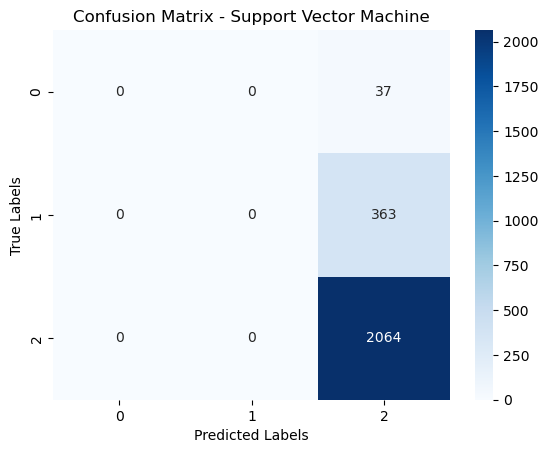

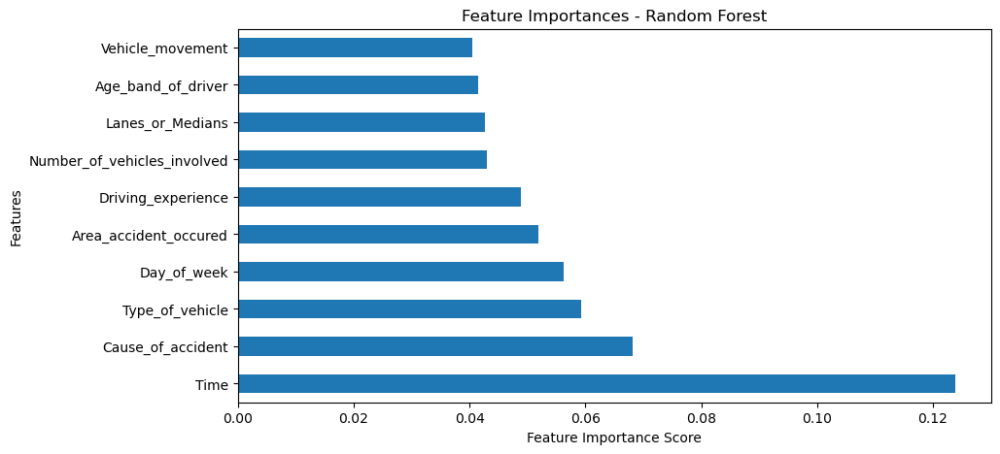

c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:624: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


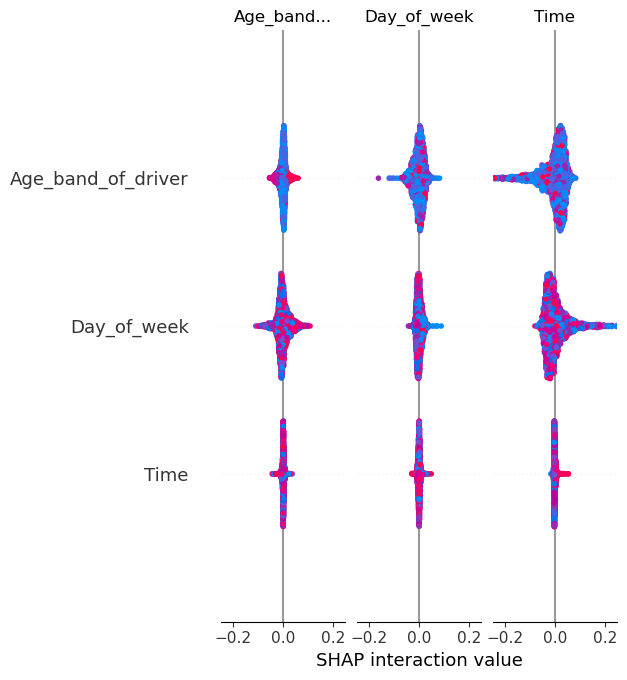

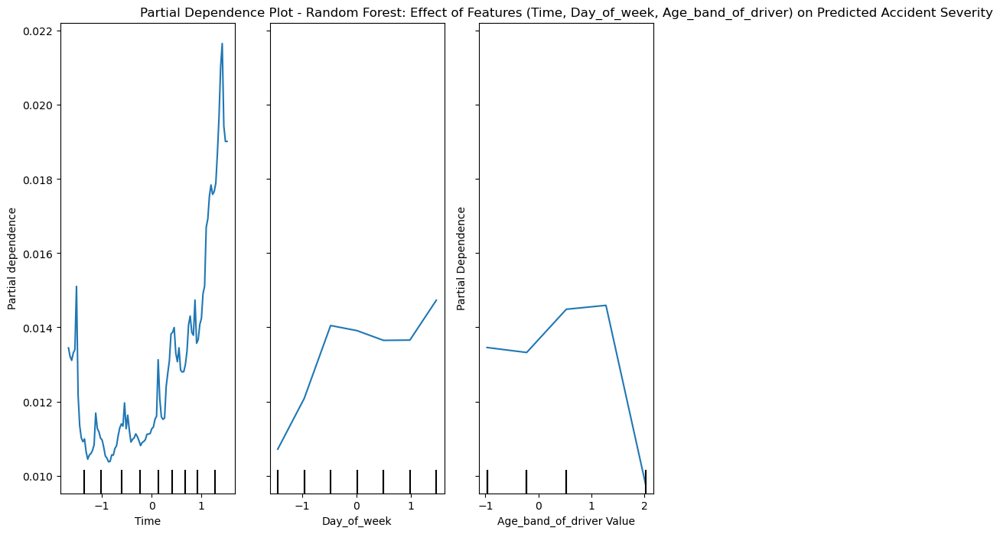

c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\fabio\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:624: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


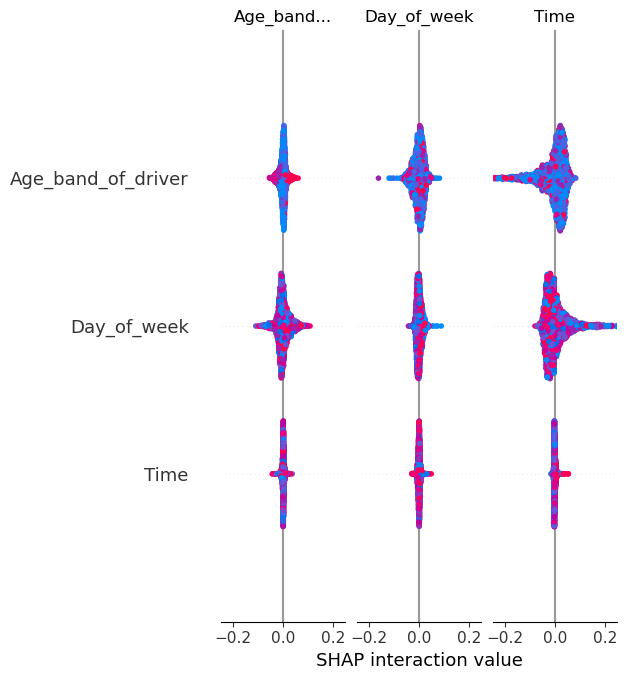

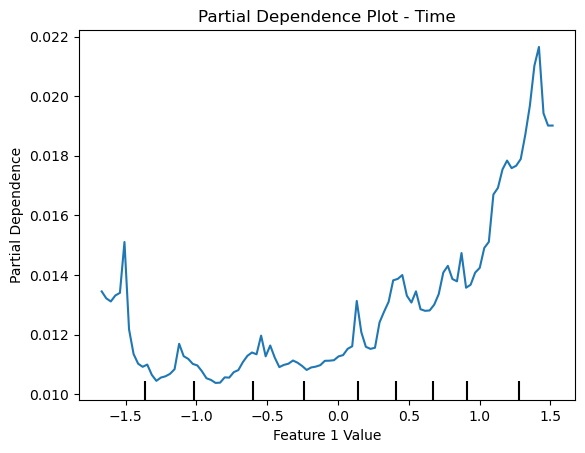

In [28]:
# Install missing packages (if needed)
!pip install lime shap matplotlib seaborn pandas scikit-learn openpyxl xgboost

# Importing libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score, classification_report, cohen_kappa_score
)
from sklearn.inspection import partial_dependence, PartialDependenceDisplay
import lime.lime_tabular
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import time
import xgboost as xgb

# For visualizing SHAP
shap.initjs()

# Load the dataset
df = pd.read_excel('Accident_Dataset_Preprocessing.xlsx', sheet_name='Accident')

# Display the first few rows
df.head()

# 1. Drop columns with more than 50% missing values
threshold = 0.5 * len(df)
df = df.dropna(thresh=threshold, axis=1)

# 2. Drop rows where critical values are missing (target or key columns)
df = df.dropna(subset=['Accident_severity', 'Time'])

# 3. Impute categorical features with the most frequent value (mode)
for column in df.select_dtypes(include='object').columns:
    df[column].fillna(df[column].mode()[0], inplace=True)

# 4. Impute numerical features with the median value
for column in df.select_dtypes(include=['int64', 'float64']).columns:
    df[column].fillna(df[column].median(), inplace=True)

# Verify if all missing values are handled
print(df.isnull().sum())

# Save the preprocessed dataset to an Excel file
df.to_excel('Accident_Dataset_After_Preprocessing.xlsx', index=False)
print("Preprocessed dataset saved successfully.")

# Load the preprocessed dataset
df = pd.read_excel('Accident_Dataset_After_Preprocessing.xlsx')

# Display the first few rows to confirm
df.head()

# Encode categorical variables
label_encoders = {}
for column in df.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

# Separate features and target
X = df.drop('Accident_severity', axis=1)
y = df['Accident_severity']

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train the Decision Tree model
start_time = time.time()
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
dt_time = time.time() - start_time

# Train the Logistic Regression model
start_time = time.time()
lr_model = LogisticRegression(max_iter=1000, random_state=42)
lr_model.fit(X_train, y_train)
lr_time = time.time() - start_time

# Train the Random Forest model
start_time = time.time()
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_time = time.time() - start_time

# Train the XGBoost model
start_time = time.time()
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train, y_train)
xgb_time = time.time() - start_time

# Train the Support Vector Machine model
start_time = time.time()
svc_model = SVC(probability=True, random_state=42)
svc_model.fit(X_train, y_train)
svc_time = time.time() - start_time

# Define a function to evaluate models
def evaluate_model(model, X_test, y_test, model_name, train_time):
    y_pred = model.predict(X_test)
    print(f"Performance Metrics for {model_name}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred, average='weighted'))
    print("Recall:", recall_score(y_test, y_pred, average='weighted'))
    print("F1 Score:", f1_score(y_test, y_pred, average='weighted'))
    print("Cohen's Kappa:", cohen_kappa_score(y_test, y_pred))
    print("Training Time:", train_time, "seconds")
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Evaluate all models
evaluate_model(dt_model, X_test, y_test, "Decision Tree", dt_time)
evaluate_model(lr_model, X_test, y_test, "Logistic Regression", lr_time)
evaluate_model(rf_model, X_test, y_test, "Random Forest", rf_time)
evaluate_model(xgb_model, X_test, y_test, "XGBoost", xgb_time)
evaluate_model(svc_model, X_test, y_test, "Support Vector Machine", svc_time)

# Confusion Matrix for all models
models = {
    'Decision Tree': dt_model,
    'Logistic Regression': lr_model,
    'Random Forest': rf_model,
    'XGBoost': xgb_model,
    'Support Vector Machine': svc_model
}

for model_name, model in models.items():
    conf_matrix = confusion_matrix(y_test, model.predict(X_test))
    sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

# Feature Importance for Random Forest
plt.figure(figsize=(10, 5))
feature_importances = pd.Series(rf_model.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importances - Random Forest')
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.show()

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train, feature_names=X.columns, class_names=['Slight', 'Serious'], mode='classification'
)

# Explain a sample prediction with LIME (Random Forest)
i = 5  # Example index from test set
exp = explainer.explain_instance(X_test[i], rf_model.predict_proba)
exp.show_in_notebook()

# Initialize SHAP TreeExplainer
shap_explainer = shap.TreeExplainer(rf_model)
shap_values = shap_explainer.shap_values(X_test)

# Plot SHAP summary
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# Plot PDP (Partial Dependence Plot)
features_to_plot = [0, 1, 2]  # Indexes of features to plot (example)
fig, ax = plt.subplots(figsize=(10, 8))
PartialDependenceDisplay.from_estimator(rf_model, X_train, features=features_to_plot, feature_names=X.columns, target=0, ax=ax)
plt.title(f"Partial Dependence Plot - Random Forest: Effect of Features ({', '.join(X.columns[features_to_plot])}) on Predicted Accident Severity")
plt.xlabel(f"{X.columns[2]} Value")
plt.ylabel('Partial Dependence')
plt.show()

# Visual comparison of LIME, SHAP, and PDP
# SHAP Summary Plot
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# PDP for one feature
PartialDependenceDisplay.from_estimator(rf_model, X_train, features=[0], feature_names=X.columns, target=0)
plt.title(f"Partial Dependence Plot - {X.columns[0]}")
plt.xlabel('Feature 1 Value')
plt.ylabel('Partial Dependence')
plt.show()
